## Preamble

In [1]:
import numpy as np
from scipy.integrate import odeint
from scipy.integrate import quad
from scipy.interpolate import InterpolatedUnivariateSpline as interpolate
from scipy.optimize import root, fsolve
from scipy.misc import derivative
import scipy.linalg as lg

import sympy as sp
import fractions as fra

# install the tabulate module using: "conda install tabulate"
from tabulate import tabulate

from ipywidgets import interact

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import matplotlib as mpl
import matplotlib.pyplot as plt

import matplotlib.ticker as ticker
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
%run -i "./rcParameters.py"
from mpl_toolkits.mplot3d import Axes3D

plt.rcParams["font.family"]='Times New Roman'
plt.rcParams["mathtext.fontset"]='stix';

In [3]:
# set fontsize in markdown cells
from IPython.core.display import display, HTML, Latex
display(HTML("<style>.rendered_html { font-size: 16px; }</style>"))

In [4]:
def multiple_formatter(denominator=2, number=np.pi, latex='\pi'):
    def gcd(a, b):
        while b:
            a, b = b, a%b
        return a
    def _multiple_formatter(x, pos):
        den = denominator
        num = np.int(np.rint(den*x/number))
        com = gcd(num,den)
        (num,den) = (int(num/com),int(den/com))
        if den==1:
            if num==0:
                return r'$0$'
            if num==1:
                return r'$%s$'%latex
            elif num==-1:
                return r'$-%s$'%latex
            else:
                return r'$%s%s$'%(num,latex)
        else:
            if num==1:
                return r'$\frac{%s}{%s}$'%(latex,den)
            elif num==-1:
                return r'$\frac{-%s}{%s}$'%(latex,den)
            else:
                return r'$\frac{%s%s}{%s}$'%(num,latex,den)
    return _multiple_formatter

class Multiple:
    def __init__(self, denominator=2, number=np.pi, latex='\pi'):
        self.denominator = denominator
        self.number = number
        self.latex = latex

    def locator(self):
        return plt.MultipleLocator(self.number / self.denominator)

    def formatter(self):
        return plt.FuncFormatter(multiple_formatter(self.denominator, self.number, self.latex))


## Utility functions

In [5]:
# chop(expr) = 0 if |expr| < delta
def chop(expr, delta=10**-10):
    return np.ma.masked_inside(expr, -delta, delta).filled(0)


In [6]:
# Bifurcation diagram: x vs r
def BF_diag(f,x1,x2,r1,r2,nx=80,nr=80,col='k',title='',x_lab='$r$',y_lab='$x^\star$'):
    fx = lambda x,r: derivative(f,x,dx=1e-6,args=(r,))
    x=np.linspace(x1,x2,nx)
    r=np.linspace(r1,r2,nr)
    R,X = np.meshgrid(r,x)
    Z = f(X,R)
    Zx= fx(X,R)
    Zu= np.ma.masked_where(Zx<0,Z)
    Zs= np.ma.masked_where(Zx>0,Z)

    fig, ax=plt.subplots(figsize=(6,4))
    ax.contour(R,X,Zs,levels=[0],colors=col,linewidths=3)
    ax.contour(R,X,Zu,levels=[0],colors=col,linewidths=3,linestyles='dashed')
    ax.grid()
    ax.set_xlabel(x_lab)
    ax.set_ylabel(y_lab)
    ax.set_title(title,color='b')
    plt.show()    

In [7]:
# Phase portrait: streamplot X,Y,Vx=dx/dt,Vy=dy/dt
def PP_2d(x1,x2,y1,y2,f1,f2,ax,nx=100,ny=100,dens=[1,1],lw=1,col='k'):
    ax = ax or plt.gca()
    x = np.linspace(x1,x2,nx)
    y = np.linspace(y1,y2,ny)
    X,Y = np.meshgrid(x,y)
    U = f1(X,Y); V = f2(X,Y)
    ax.streamplot(X,Y,U,V,density=dens,
                 linewidth=lw,color=col,arrowstyle='->')
    return ax

# Phase portrait: streamlines through selected points
def PP_2d_sp(x1,x2,y1,y2,f1,f2,seed_points,ax,nx=100,ny=100,dens=[1,1],lw=1,col='k',ar_s='->'):
    ax = ax or plt.gca()
    x = np.linspace(x1,x2,nx)
    y = np.linspace(y1,y2,ny)
    X,Y = np.meshgrid(x,y)
    U = f1(X,Y); V = f2(X,Y)    
    ax.streamplot(X,Y,U,V,density=dens,start_points=seed_points.T,
                 linewidth=lw,color=col,arrowstyle=ar_s)
    return ax    

# Phase portrait: streamlines through selected points + nullclines
def PP_2d_sp_nc(x1,x2,y1,y2,f1,f2,seed_points,ax,nx=100,ny=100,dens=[1,1],lw=1,col='k',ar_s='->'):
    ax = ax or plt.gca()
    x = np.linspace(x1,x2,nx)
    y = np.linspace(y1,y2,ny)
    X,Y = np.meshgrid(x,y)
    U = f1(X,Y); V = f2(X,Y)    
    ax.streamplot(X,Y,U,V,density=dens,start_points=seed_points.T,
                 linewidth=lw,color=col,arrowstyle=ar_s)
    ax.contour(X,Y,U,[0],colors='m')
    ax.contour(X,Y,V,[0],colors='b')
    return ax    

# Phase portrait: nullclines
def PP_nc(x1,x2,y1,y2,f1,f2,ax,nx=100,ny=100,lw=1,c1='m',c2='b'):
    ax = ax or plt.gca()
    x = np.linspace(x1,x2,nx)
    y = np.linspace(y1,y2,ny)
    X,Y = np.meshgrid(x,y)
    U = f1(X,Y); V = f2(X,Y)    
    ax.contour(X,Y,U,[0],colors='m')
    ax.contour(X,Y,V,[0],colors='b')
    return ax    

# Display fixed points
def PP_FPs(FPs,tau,delta,ax):
    ax = ax or plt.gca()
    for j in np.arange(len(FPs)):
        if FPs[j][0].is_real and FPs[j][1].is_real:
            FP_ = np.array(FPs[j],dtype=float) 
            if tau[j]<0 and delta[j]>0:
                print('stable FP: ',FP_)
                ax.plot(FP_[0],FP_[1],'ro',ms=8,mfc='r',mec='r',lw=2)
            else:
                print('unstable FP: ',FP_)
                ax.plot(FP_[0],FP_[1],'ro',ms=8,mfc='w',mec='r',lw=2)
    return ax

In [8]:
def get_FP_data(f1,f2,tab=True):
    '''
    input: f1(x,y) and f2(x,y) for 2D dynamical system
    output: FPs and attributes: tau, delta, tau^2-4.delta, 
                                eigen-values/-vectors of Jacobian matrix
    '''
    FPs = sp.solve((f1(x,y),f2(x,y)),x,y) 
    FPsd= [{x:a[0],y:a[1]} for a in FPs]
    print('Fixed points: ',FPsd)

    A = lambda x,y: sp.Matrix([f1(x,y),f2(x,y)]).jacobian([x,y])
    display(Latex(r'$A ={}$'.format(sp.latex(A(x,y)))))

    A_FPs = [A(x,y).subs(a) for a in FPsd]
    display(Latex(r'For each FP evaluate $A$, $\tau=Tr(A)$, $\Delta=det(A)$, $\tau^2-4\Delta$'))
    [display(a) for a in A_FPs];

    tau   = [a.trace().simplify() for a in A_FPs]
    display(Latex(r'$\tau = {}$'.format(sp.latex(tau))))
    delta = [a.det().simplify()   for a in A_FPs]
    display(Latex(r'$\Delta = {}$'.format(sp.latex(delta))))
    disc  = [(t**2 - 4*d).simplify() for t,d in zip(tau,delta)]
    display(Latex(r'$\tau^2-4\Delta = {}$'.format(sp.latex(disc))))

    # tabulate data for FPs
    if tab :
        table=[[FPsd[i],tau[i],delta[i],disc[i]] for i in np.arange(len(FPs))]
        print(tabulate(table,headers=('Fixed point','tau','delta','disc'),
                   tablefmt='fancy_grid'))
    return FPs, tau, delta, disc

In [9]:
# functions to calculate trajectory {x(t),y(t)} numerically for given {x0,y0} 
# input: functions f1,f2; duration T and timestep dt of trajectory; initial condition xy0=[x0,y0]
# output: [t,sol] = [t,[x(t),y(t)]]

def txy_traj(f1,f2,T,dt,xy0):
    t = np.arange(0,T+dt,dt)
    def RHS(xy,t):
        x,y=xy
        return[f1(x,y),f2(x,y)]
    sol = odeint(RHS,xy0,t)
    return [t,sol]

## Problem 1

#### (a) Bifurcations as $\gamma$ and $\epsilon$ vary

Define $x=\phi$ and $y=\dot\phi=\varphi$

In [19]:
x,y = sp.symbols('x,y',real=True)
e,g = sp.symbols('e,g',positive=True)

In [20]:
f1 = lambda x,y: y
f2 = lambda x,y: (-y-sp.sin(x)+g*sp.sin(x)*sp.cos(x))/e
FPs, tau, delta, disc = get_FP_data(f1,f2,tab=True)

Fixed points:  [{x: 0, y: 0}, {x: -2*atan(sqrt(g - 1)/sqrt(g + 1)), y: 0}, {x: 2*atan(sqrt(g - 1)/sqrt(g + 1)), y: 0}]


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Matrix([
[        0,    1],
[(g - 1)/e, -1/e]])

Matrix([
[                                                                                                                                0,    1],
[(-g*sin(2*atan(sqrt(g - 1)/sqrt(g + 1)))**2 + g*cos(2*atan(sqrt(g - 1)/sqrt(g + 1)))**2 - cos(2*atan(sqrt(g - 1)/sqrt(g + 1))))/e, -1/e]])

Matrix([
[                                                                                                                                0,    1],
[(-g*sin(2*atan(sqrt(g - 1)/sqrt(g + 1)))**2 + g*cos(2*atan(sqrt(g - 1)/sqrt(g + 1)))**2 - cos(2*atan(sqrt(g - 1)/sqrt(g + 1))))/e, -1/e]])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

╒═════════════════════════════════════════════╤═══════╤══════════════════╤═══════════════════════════════╕
│ Fixed point                                 │ tau   │ delta            │ disc                          │
╞═════════════════════════════════════════════╪═══════╪══════════════════╪═══════════════════════════════╡
│ {x: 0, y: 0}                                │ -1/e  │ (1 - g)/e        │ (4*e*(g - 1) + 1)/e**2        │
├─────────────────────────────────────────────┼───────┼──────────────────┼───────────────────────────────┤
│ {x: -2*atan(sqrt(g - 1)/sqrt(g + 1)), y: 0} │ -1/e  │ (g**2 - 1)/(e*g) │ (4*e*(1 - g**2) + g)/(e**2*g) │
├─────────────────────────────────────────────┼───────┼──────────────────┼───────────────────────────────┤
│ {x: 2*atan(sqrt(g - 1)/sqrt(g + 1)), y: 0}  │ -1/e  │ (g**2 - 1)/(e*g) │ (4*e*(1 - g**2) + g)/(e**2*g) │
╘═════════════════════════════════════════════╧═══════╧══════════════════╧═══════════════════════════════╛


Note: There is also another unstable fixed point (saddle) at $(\pi,0)$ that does note depend on $\gamma$ or $\epsilon$

#### (b) Stability diagram

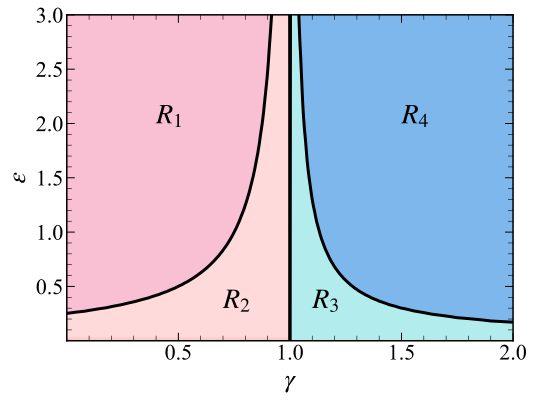

In [21]:
gg = np.linspace(1e-5,2,100)
ee = np.linspace(1e-5,3,100)
G,E= np.meshgrid(gg,ee)

delta_ = [sp.lambdify([g,e],d) for d in delta[0:2]]
disc_  = [sp.lambdify([g,e],d) for d in disc[0:2]]

fig, ax=plt.subplots()
ax.contour(G,E,delta_[0](G,E)*disc_[0](G,E),0,colors='k',linewidths=3)
ax.contourf(G,E,disc_[0](G,E),[-1e8,0,1e8],colors=['m','w'],alpha=0.3)
ax.contourf(G,E,delta_[0](G,E),[-1e8,0,1e8],colors=['w','r'],alpha=0.3)

ax.contour(G,E,delta_[1](G,E)*disc_[1](G,E),0,colors='k',linewidths=3)
ax.contourf(G,E,disc_[1](G,E),[-1e8,0,1e8],colors=['b','w'],alpha=0.3)
ax.contourf(G,E,delta_[1](G,E),[-1e8,0,1e8],colors=['w','c'],alpha=0.3)

ax.text(0.4,2,'$R_1$',fontsize=28)
ax.text(0.7,0.3,'$R_2$',fontsize=28)
ax.text(1.1,0.3,'$R_3$',fontsize=28)
ax.text(1.5,2,'$R_4$',fontsize=28)

ax.set_xlabel(r'$\gamma$')
ax.set_ylabel(r'$\epsilon$')
plt.show()

#### Phase portraits corresponding to $R_1,\ldots,R_4$

In [22]:
# define a function [PP_ge] that plots the phase portrait for a pair of values 
# g=gamma and e=epsilon; e.g., PP_ge({g:0.8,e:1.5}) correrspond to g=0.8 and e=1.5
def PP_ge(par):
    f1_ = sp.lambdify([x,y],f1(x,y))

    x1 = -np.pi; x2 = np.pi
    y1 = -2; y2 = 2


    n1=10; n2=12; n3=10
    ppx = lambda x1,x2,nx: np.linspace(x1,x2,nx)
    pp1 = lambda nx: np.ones(nx)

    fig2, ax = plt.subplots(figsize=(5,5))

    f2_ = sp.lambdify([x,y],f2(x,y).subs(par))

    # automated streamlines
    # PP_2d(x1,x2,y1,y2,f1_,f2_,ax,dens=2)

    # selected streamlines
    d0=8
    PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([ppx(x1,x2,n1),pp1(n1)*y1]),ax,col='gray',dens=d0)
    PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([pp1(n3)*x1,ppx(y1,y2,n3)]),ax,col='gray',dens=d0)
    PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([ppx(x1,x2,n1),pp1(n1)*y2]),ax,col='gray',dens=d0)
    PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([pp1(n3)*x2,ppx(y1,y2,n3)]),ax,col='gray',dens=d0)

    # plot nulclines
    # PP_nc(x1,x2,y1,y2,f1_,f2_,ax)

    # display fixed points
    FPs_ = [(d[0].subs(par),d[1].subs(par)) for d in FPs]
    tau_ = [d.subs(par) for d in tau]
    delta_ = [d.subs(par) for d in delta]
    PP_FPs(FPs_,tau_,delta_,ax)

    ax.set_title('$\gamma={}\;,\;\;\epsilon={} $'.format(par[g],par[e]),c='b')
    # ax.set_aspect('equal')
    ax.set_xlim(x1,x2)
    ax.set_ylim(y1,y2)
    ax.set_xlabel(r'$\phi$')
    ax.set_ylabel(r'$\dot\phi$')

    ax.xaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(np.pi / 12))
    ax.xaxis.set_major_formatter(plt.FuncFormatter(multiple_formatter()))
    ax.grid()
    plt.show()

stable FP:  [0. 0.]


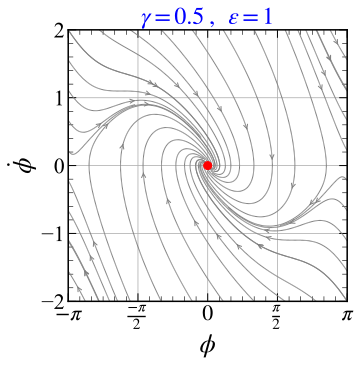

In [23]:
# phase portrait for g=0.5, e=1 (region R1 in stability diagram)
PP_ge({g:0.5,e:1})

stable FP:  [0. 0.]


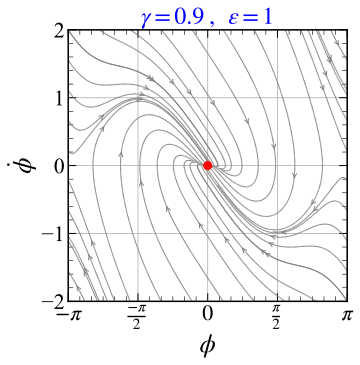

In [24]:
# phase portrait for g=0.9, e=1 (region R2 in stability diagram)
PP_ge({g:0.9,e:1})

unstable FP:  [0. 0.]
stable FP:  [-0.42969967  0.        ]
stable FP:  [0.42969967 0.        ]


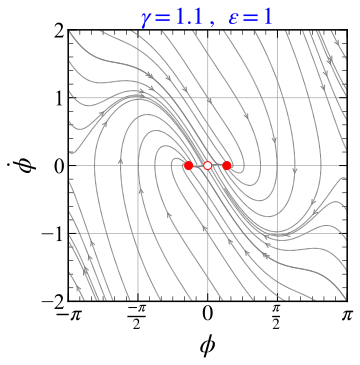

In [25]:
# phase portrait for g=1.1, e=1 (region R3 in stability diagram)
PP_ge({g:1.1,e:1})

unstable FP:  [0. 0.]
stable FP:  [-0.84106867  0.        ]
stable FP:  [0.84106867 0.        ]


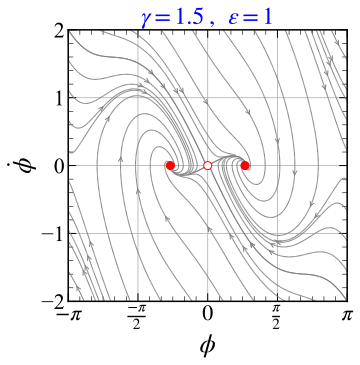

In [26]:
# phase portrait for g=1.5, e=1 (region R4 in stability diagram)
PP_ge({g:1.5,e:1})

## Problem 2

Define $x=\theta_1$ and $y=\theta_2$

In [11]:
x,y = sp.symbols('x,y',real=True)
u,v = sp.symbols('u,v',real=True)
K = sp.symbols('K',nonnegative=True)

In [12]:
f1 = lambda x,y: K*sp.sin(x-y)-sp.sin(x)
f2 = lambda x,y: K*sp.sin(y-x)-sp.sin(y)

Define fixed point equations

In [13]:
eqs=[eq.expand(trig=True) for eq in [f1(x,y),f2(x,y)]]
eqs

[K*sin(x)*cos(y) - K*sin(y)*cos(x) - sin(x),
 -K*sin(x)*cos(y) + K*sin(y)*cos(x) - sin(y)]

Change variable from $x$, $y$ to $u=\tan(x/2)$, $v=\tan(y/2)$

In [14]:
eq1_ = f1(x,y).expand(trig=True).subs({sp.sin(x):2*u/(1+u*u),sp.cos(x):(1-u*u)/(1+u*u),
                                       sp.sin(y):2*v/(1+v*v),sp.cos(y):(1-v*v)/(1+v*v)}).simplify()
eq1 = eq1_*(1+u*u)*(1+v*v)

eq2_ = f2(x,y).expand(trig=True).subs({sp.sin(x):2*u/(1+u*u),sp.cos(x):(1-u*u)/(1+u*u),
                                       sp.sin(y):2*v/(1+v*v),sp.cos(y):(1-v*v)/(1+v*v)}).simplify()
eq2 = eq2_*(1+u*u)*(1+v*v)

Calculate fixed points $(u^*,v^*)$ and $(x^*,y*)$, using $x=\tan^{-1}\frac{2u}{1-u^2}$, etc.

In [15]:
FPuv = sp.solve((eq1,eq2),(u,v))
u0 = FPuv[1][1]
k0 = sp.atan((2*u0/(1-u0**2)).simplify())
FPxy = [(0.,0.),(-k0,k0),(k0,-k0)]

In [17]:
# Fixed points and their properties
print('Fixed points (x*,y*): ',FPxy)
print('Fixed points (u*,v*): ',FPuv)


#Fpsd = [(0,0),(0,sp.pi),(sp.pi,sp.pi),(sp.atan(sp.sqrt(4*K**2-1)),-sp.atan())]

A = lambda u,v: sp.Matrix([eq1,eq2]).jacobian([u,v])
display(Latex(r'$A ={}$'.format(sp.latex(A(u,v)))))

A_FPs = [A(u,v).subs({u:a[0],v:a[1]}) for a in np.array(FPuv)]
display(Latex(r'For each FP evaluate $A$, $\tau=Tr(A)$, $\Delta=det(A)$, $\tau^2-4\Delta$'))
[display(a) for a in A_FPs];

tau   = [a.trace().simplify() for a in A_FPs]
display(Latex(r'$\tau = {}$'.format(sp.latex(tau))))
delta = [a.det().simplify()   for a in A_FPs]
display(Latex(r'$\Delta = {}$'.format(sp.latex(delta))))
disc  = [(t**2 - 4*d).simplify() for t,d in zip(tau,delta)]
display(Latex(r'$\tau^2-4\Delta = {}$'.format(sp.latex(disc))))

Fixed points (x*,y*):  [(0.0, 0.0), (-atan(sqrt(4*K**2 - 1)), atan(sqrt(4*K**2 - 1))), (atan(sqrt(4*K**2 - 1)), -atan(sqrt(4*K**2 - 1)))]
Fixed points (u*,v*):  [(0, 0), (-sqrt(2*K - 1)/sqrt(2*K + 1), sqrt(2*K - 1)/sqrt(2*K + 1)), (sqrt(2*K - 1)/sqrt(2*K + 1), -sqrt(2*K - 1)/sqrt(2*K + 1))]


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Matrix([
[2*K - 2,    -2*K],
[   -2*K, 2*K - 2]])

Matrix([
[2*K*(-3*(2*K - 1)/(2*K + 1) + 1) - 2*(2*K - 1)/(2*K + 1) - 2,      2*K*(3*(2*K - 1)/(2*K + 1) - 1) + 4*(2*K - 1)/(2*K + 1)],
[     2*K*(3*(2*K - 1)/(2*K + 1) - 1) + 4*(2*K - 1)/(2*K + 1), 2*K*(-3*(2*K - 1)/(2*K + 1) + 1) - 2*(2*K - 1)/(2*K + 1) - 2]])

Matrix([
[2*K*(-3*(2*K - 1)/(2*K + 1) + 1) - 2*(2*K - 1)/(2*K + 1) - 2,      2*K*(3*(2*K - 1)/(2*K + 1) - 1) + 4*(2*K - 1)/(2*K + 1)],
[     2*K*(3*(2*K - 1)/(2*K + 1) - 1) + 4*(2*K - 1)/(2*K + 1), 2*K*(-3*(2*K - 1)/(2*K + 1) + 1) - 2*(2*K - 1)/(2*K + 1) - 2]])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [19]:
# function to plot (and save to file) the phase portrait for different K values
def PP_K(K_,fname=None):
    f1_ = sp.lambdify([x,y],f1(x,y).subs(K,K_))
    f2_ = sp.lambdify([x,y],f2(x,y).subs(K,K_))

    dx=0.2
    x1 = -np.pi-dx; x2 = np.pi+dx
    y1 = -np.pi-dx; y2 = np.pi+dx

    d0 = 1

    n1=20; n2=12; n3=10
    ppx = lambda x1,x2,nx: np.linspace(x1,x2,nx)
    pp1 = lambda nx: np.ones(nx)

    fig2, ax = plt.subplots(figsize=(5,5))

    # automated streamlines
    PP_2d(x1,x2,y1,y2,f1_,f2_,ax,col='gray',dens=2)

    # selected streamlines
    # PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([ppx(x1,x2,n1),pp1(n1)*y1]),ax,col='k',dens=d0)
    # PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([pp1(n1)*x1,ppx(y1,y2,n1)]),ax,col='k',dens=d0)
    # PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([ppx(x1,x2,n1),pp1(n1)*y2]),ax,col='k',dens=d0)
    # PP_2d_sp(x1,x2,y1,y2,f1_,f2_,np.array([pp1(n1)*x2,ppx(y1,y2,n1)]),ax,col='k',dens=d0)

    # plot nulclines
    PP_nc(x1,x2,y1,y2,f1_,f2_,ax)

    # display fixed points
    # PP_FPs(FPs,tau,delta,ax)
    k0_=k0.subs(K,K_)
    FPs_ = [(k0_*0,k0_*0),(-k0_,k0_),(k0_,-k0_)]
    tau_ = [d.subs(K,K_) for d in tau]
    delta_ = [d.subs(K,K_) for d in delta]
    PP_FPs(FPs_,tau_,delta_,ax)

    ax.set_aspect('equal')
    ax.set_xlim(x1,x2)
    ax.set_ylim(y1,y2)
    ax.set_xlabel(r'$\theta_1$')
    ax.set_ylabel(r'$\theta_2$')
    ax.set_title('$K={}$'.format(K_),c='b')
    ax.xaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(np.pi / 12))
    ax.xaxis.set_major_formatter(plt.FuncFormatter(multiple_formatter()))
    ax.yaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
    ax.yaxis.set_minor_locator(plt.MultipleLocator(np.pi / 12))
    ax.yaxis.set_major_formatter(plt.FuncFormatter(multiple_formatter()))
    ax.grid()
    if fname: fig2.savefig(fname)
    plt.show()

stable FP:  [0. 0.]


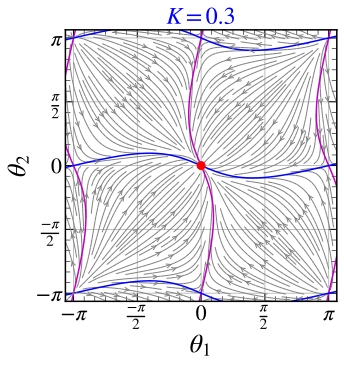

In [20]:
PP_K(0.3)

unstable FP:  [0. 0.]
stable FP:  [-0.19835452  0.19835452]
stable FP:  [ 0.19835452 -0.19835452]


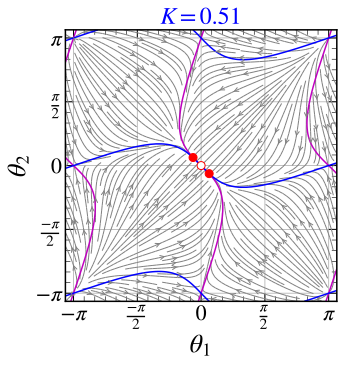

In [22]:
PP_K(0.51)

unstable FP:  [0. 0.]
stable FP:  [-0.77519337  0.77519337]
stable FP:  [ 0.77519337 -0.77519337]


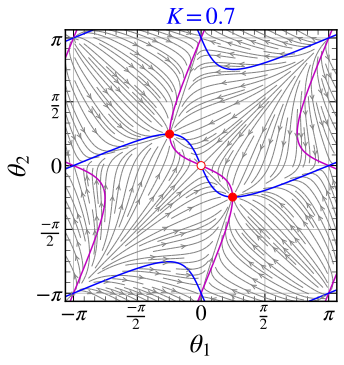

In [35]:
PP_K(0.7)

## Problem 3

In [10]:
x,y,a = sp.symbols('x,y,a',nonnegative=True)
f1 = lambda x,y: x*(x*(1-x)-y)
f2 = lambda x,y: y*(x-a)

In [11]:
# find fixed points and their properties
FPs, tau, delta, disc  = get_FP_data(f1,f2,tab=True)

Fixed points:  [{x: 0, y: 0}, {x: 1, y: 0}, {x: a, y: -a*(a - 1)}]


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Matrix([
[0,  0],
[0, -a]])

Matrix([
[-1,    -1],
[ 0, 1 - a]])

Matrix([
[a*(1 - 2*a) + a*(1 - a) + a*(a - 1), -a],
[                         -a*(a - 1),  0]])

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

╒═══════════════════════╤═════════════╤══════════════╤═══════════════════╕
│ Fixed point           │ tau         │ delta        │ disc              │
╞═══════════════════════╪═════════════╪══════════════╪═══════════════════╡
│ {x: 0, y: 0}          │ -a          │ 0            │ a**2              │
├───────────────────────┼─────────────┼──────────────┼───────────────────┤
│ {x: 1, y: 0}          │ -a          │ a - 1        │ a**2 - 4*a + 4    │
├───────────────────────┼─────────────┼──────────────┼───────────────────┤
│ {x: a, y: -a*(a - 1)} │ a*(1 - 2*a) │ a**2*(1 - a) │ a**2*(4*a**2 - 3) │
╘═══════════════════════╧═════════════╧══════════════╧═══════════════════╛


In [12]:
T = lambda a: 2*sp.pi/sp.sqrt(delta.subs(b,b_c)).simplify()
display(Latex('$T={}$'.format(sp.latex(T(a)))))
T_ = sp.lambdify(a,T(a))

AttributeError: 'list' object has no attribute 'subs'

Use `sp.solve()` to determine the values of $a$ that meet different conditions

In [26]:
# e.g., 3-rd fixed point is a stable spiral if 
sp.solve((tau[2]<0,delta[2]>0,disc[2]<0),a)

(1/2 < a) & (a < sqrt(3)/2)

In [27]:
# e.g., 3-rd fixed point is a stable node if 
sp.solve((tau[2]<0,delta[2]>0,disc[2]>0),a)

(a < 1) & (sqrt(3)/2 < a)

In [28]:
# e.g., 3-rd fixed point is a unstable spiral if 
sp.solve((tau[2]>0,delta[2]>0,disc[2]<0),a)

(0 < a) & (a < 1/2)

Plot phase portrait for $a=0.45,0.7,0.9$

unstable FP:  [0. 0.]
unstable FP:  [1. 0.]
unstable FP:  [0.45   0.2475]


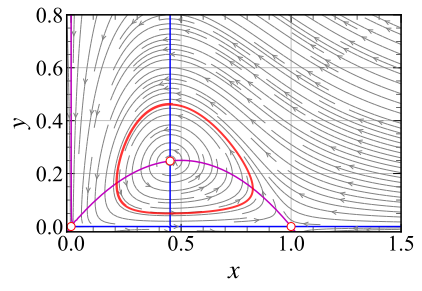

In [29]:
# find LC for a=0.45
a_ = 0.45
f2_ = sp.lambdify([x,y],f2(x,y).subs(a,a_))
T=80; dt=0.02; t0=int(0.6*T/dt)
t,xy = txy_traj(f1,f2_,T,dt,xy0=[0.5,0.5])

x1=y1=-0.02; x2=1.5; y2=0.8
fig, ax = plt.subplots(figsize=(6,4))

# plot streemlines
PP_2d(x1,x2,y1,y2,f1,f2_,ax,col='gray',dens=1.5)
# plot LC
ax.plot(xy[t0:,0],xy[t0:,1],'r-',lw=2,alpha=0.8)

# plot nulclines
PP_nc(x1,x2,y1,y2,f1,f2_,ax)

# display fixed points
FPs_ = [(z[0].subs(a,a_),z[1].subs(a,a_)) for z in FPs]
tau_ = [z.subs(a,a_) for z in tau]
delta_ = [z.subs(a,a_) for z in delta]
PP_FPs(FPs_,tau_,delta_,ax)

ax.grid()
ax.set_xlim(x1,x2)
ax.set_ylim(y1,y2)
ax.set_yticks(np.arange(0,y2+0.2,0.2))
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
plt.show()

unstable FP:  [0. 0.]
unstable FP:  [1. 0.]
unstable FP:  [0.5  0.25]


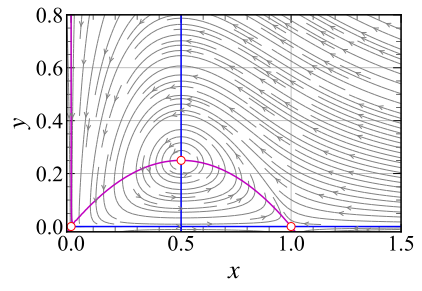

In [30]:
a_=0.5
f2_ = sp.lambdify([x,y],f2(x,y).subs(a,a_))

x1=y1=-0.02; x2=1.5; y2=0.8
fig, ax = plt.subplots(figsize=(6,4))

# plot streemlines
PP_2d(x1,x2,y1,y2,f1,f2_,ax,col='gray',dens=1.5)

# plot nulclines
PP_nc(x1,x2,y1,y2,f1,f2_,ax)

# display fixed points
FPs_ = [(z[0].subs(a,a_),z[1].subs(a,a_)) for z in FPs]
tau_ = [z.subs(a,a_) for z in tau]
delta_ = [z.subs(a,a_) for z in delta]
PP_FPs(FPs_,tau_,delta_,ax)

ax.grid()
ax.set_xlim(x1,x2)
ax.set_ylim(y1,y2)
ax.set_yticks(np.arange(0,y2+0.2,0.2))
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
plt.show()

unstable FP:  [0. 0.]
unstable FP:  [1. 0.]
stable FP:  [0.55   0.2475]


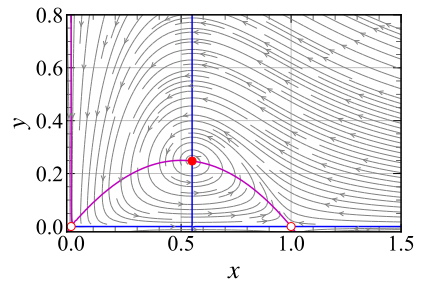

In [31]:
a_=0.55
f2_ = sp.lambdify([x,y],f2(x,y).subs(a,a_))

x1=y1=-0.02; x2=1.5; y2=0.8
fig, ax = plt.subplots(figsize=(6,4))

# plot streemlines
PP_2d(x1,x2,y1,y2,f1,f2_,ax,col='gray',dens=1.5)

# plot nulclines
PP_nc(x1,x2,y1,y2,f1,f2_,ax)

# display fixed points
FPs_ = [(z[0].subs(a,a_),z[1].subs(a,a_)) for z in FPs]
tau_ = [z.subs(a,a_) for z in tau]
delta_ = [z.subs(a,a_) for z in delta]
PP_FPs(FPs_,tau_,delta_,ax)

ax.grid()
ax.set_xlim(x1,x2)
ax.set_ylim(y1,y2)
ax.set_yticks(np.arange(0,y2*1.1,0.2))
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
plt.show()

unstable FP:  [0. 0.]
stable FP:  [1. 0.]
unstable FP:  [ 1.1  -0.11]


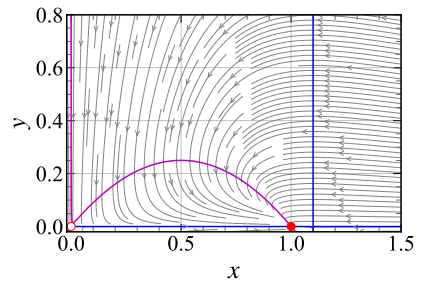

In [44]:
a_=1.1
f2_ = sp.lambdify([x,y],f2(x,y).subs(a,a_))

x1=y1=-0.02; x2=1.5; y2=0.8
fig, ax = plt.subplots(figsize=(6,4))

# plot streemlines
PP_2d(x1,x2,y1,y2,f1,f2_,ax,col='gray',dens=1.5)

# plot nulclines
PP_nc(x1,x2,y1,y2,f1,f2_,ax)

# display fixed points
FPs_ = [(z[0].subs(a,a_),z[1].subs(a,a_)) for z in FPs]
tau_ = [z.subs(a,a_) for z in tau]
delta_ = [z.subs(a,a_) for z in delta]
PP_FPs(FPs_,tau_,delta_,ax)

ax.grid()
ax.set_xlim(x1,x2)
ax.set_ylim(y1,y2)
ax.set_yticks(np.arange(0,y2*1.1,0.2))
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
plt.show()

## Problem 4

#### (a) Integrate the dynamical equations

In [14]:
# functions to calculate X_T(t)={x(t),y(t),z(t)} and X_R(t)={xr(t),yr(t),zr(t)} 
# input: functions f1,f2,f3,f1r,f2r,f3r; duration T; timestep dt; 
#        initial conditions X0=[x0,y0,z0,xr0,yr0,zr0]
# output: [t,sol] = [t,[x(t),y(t),z(t),xr(t),yr(t),zr(t)]]

def t_XT_XR(f1,f2,f3,f1r,f2r,f3r,T,dt,X0):
    t = np.arange(0,T+dt,dt)
    def RHS(X,t):
        x,y,z,xr,yr,zr=X
        return[f1(x,y,z,xr,yr,zr),f2(x,y,z,xr,yr,zr),f3(x,y,z,xr,yr,zr),
               f1r(x,y,z,xr,yr,zr),f2r(x,y,z,xr,yr,zr),f3r(x,y,z,xr,yr,zr)]
    sol = odeint(RHS,X0,t)
    return [t,sol]

In [15]:
# define the T and R eqs
r=60; s=10; b=8/3
f1  = lambda x,y,z,xr,yr,zr: s*(y-x)
f2  = lambda x,y,z,xr,yr,zr: x*(r-z)-y
f3  = lambda x,y,z,xr,yr,zr: x*y-b*z
f1r = lambda x,y,z,xr,yr,zr: x
f2r = lambda x,y,z,xr,yr,zr: r*x-yr-x*zr
f3r = lambda x,y,z,xr,yr,zr: x*yr-b*zr
# initial conditions
X0 = [15,5,-10,15,-10,-20]

In [16]:
# test solution
T_=3; dt_=0.005
[t,sol] = t_XT_XR(f1,f2,f3,f1r,f2r,f3r,T_,dt_,X0)
[t,sol]

[array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ,
        0.045, 0.05 , 0.055, 0.06 , 0.065, 0.07 , 0.075, 0.08 , 0.085,
        0.09 , 0.095, 0.1  , 0.105, 0.11 , 0.115, 0.12 , 0.125, 0.13 ,
        0.135, 0.14 , 0.145, 0.15 , 0.155, 0.16 , 0.165, 0.17 , 0.175,
        0.18 , 0.185, 0.19 , 0.195, 0.2  , 0.205, 0.21 , 0.215, 0.22 ,
        0.225, 0.23 , 0.235, 0.24 , 0.245, 0.25 , 0.255, 0.26 , 0.265,
        0.27 , 0.275, 0.28 , 0.285, 0.29 , 0.295, 0.3  , 0.305, 0.31 ,
        0.315, 0.32 , 0.325, 0.33 , 0.335, 0.34 , 0.345, 0.35 , 0.355,
        0.36 , 0.365, 0.37 , 0.375, 0.38 , 0.385, 0.39 , 0.395, 0.4  ,
        0.405, 0.41 , 0.415, 0.42 , 0.425, 0.43 , 0.435, 0.44 , 0.445,
        0.45 , 0.455, 0.46 , 0.465, 0.47 , 0.475, 0.48 , 0.485, 0.49 ,
        0.495, 0.5  , 0.505, 0.51 , 0.515, 0.52 , 0.525, 0.53 , 0.535,
        0.54 , 0.545, 0.55 , 0.555, 0.56 , 0.565, 0.57 , 0.575, 0.58 ,
        0.585, 0.59 , 0.595, 0.6  , 0.605, 0.61 , 0.615, 0.62 , 0.625,
      

#### (b) Plot $y(t)$ and $y_r(t)$

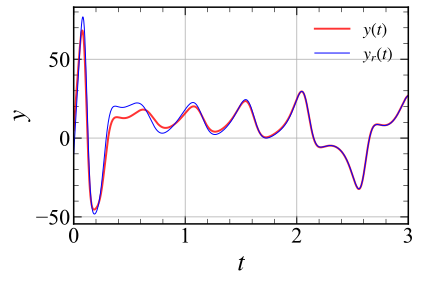

In [17]:
T_=3; dt_=0.005
[t,sol] = t_XT_XR(f1,f2,f3,f1r,f2r,f3r,T_,dt_,X0)

fig_4b, ax=plt.subplots(figsize=(6,4))
ax.plot(t,sol.T[1],'r-',lw=2,alpha=0.8,label='$y(t)$')
ax.plot(t,sol.T[4],'b-',lw=1,label='$y_r(t)$')
ax.set_xlim(0,T_)
ax.legend()
ax.set_xlabel('$t$')
ax.set_ylabel('$y$')
ax.grid()
plt.show()

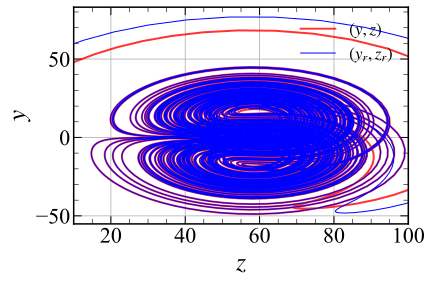

In [24]:
T_=100; dt_=0.005
[t,sol] = t_XT_XR(f1,f2,f3,f1r,f2r,f3r,T_,dt_,X0)

fig_4b, ax=plt.subplots(figsize=(6,4))
ax.plot(sol.T[2],sol.T[1],'r-',lw=2,alpha=0.8,label='$(y, z)$')
ax.plot(sol.T[5],sol.T[4],'b-',lw=1,label='$(y_r, z_r)$')
ax.set_xlim(10,T_)
ax.legend()
ax.set_xlabel('$z$')
ax.set_ylabel('$y$')
ax.grid()
plt.show()